In [2]:
import itertools
import numpy as np
import os
import seaborn as sns
from tqdm import tqdm
from dataclasses import asdict, dataclass, field
import vsketch
import shapely.geometry as sg
from shapely.geometry import box, MultiLineString, Point, MultiPoint, Polygon, MultiPolygon, LineString
import shapely.affinity as sa
import shapely.ops as so
import matplotlib.pyplot as plt
import pandas as pd

import vpype_cli
from typing import List, Generic
from genpen import genpen as gp, utils as utils
from scipy import stats as ss
import geopandas
from shapely.errors import TopologicalError
import functools
%load_ext autoreload
%autoreload 2
import vpype

# try 1

In [209]:
svgpath = '/mnt/c/code/side/plotter_images/future_comes_soon2.svg'
doc = vpype.read_multilayer_svg(svgpath, quantization=1)

In [210]:
geometries = {}
for k,v in doc.layers.items():
    geometries[k] = v.as_mls()

In [211]:
geometries

{1: <shapely.geometry.multilinestring.MultiLineString at 0x7f842dc20d30>}

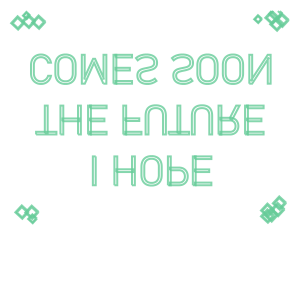

In [212]:
mls = geometries[1]
text_geos = MultiLineString([l for l in mls[4:]])
text_geos

In [213]:
page_x_inches: float = 11 # inches
page_y_inches: float = 8.5 # inches
border:float = 0.

buffer_style = 3

In [214]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)
xmin, ymin, xmax, ymax = drawbox.bounds

In [215]:
mp = MultiPolygon(gp.consolidate_polygons([Polygon(ls) for ls in text_geos]))
        

ValueError: A LinearRing must have at least 3 coordinate tuples

In [173]:
smp = gp.scale_like(mp, drawbox)
smp = sa.scale(smp, xfact=0.9, yfact=0.9)
cmp = gp.center_at(smp, drawbox.centroid)

In [174]:
dp = gp.robust_difference(drawbox, cmp)

ERROR:shapely.geos:TopologyException: Input geom 1 is invalid: Self-intersection at or near point 44.927753128434915 86.970076301599477 at 44.927753128434915 86.970076301599477


In [203]:
stp = gp.ScaleTransPrms(n_iters=200, d_buffer=-0.35, d_translate_factor=0.7, angles=30)
stp.d_buffers *= gp.gaussian_random_walk(n=stp.d_buffers.shape[0], step_std=15)

In [204]:
stp.angles = np.linspace(0, np.radians(360*4), len(stp.d_buffers))

In [205]:
scaled = gp.scale_trans(dp, **stp.prms)

In [216]:
layer = gp.merge_LineStrings([p.boundary for p in reversed(scaled)])

In [217]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
sk.geometry(layer)
sk.display(color_mode='None')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2020-12-06T10:21:28.376559 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polygon points="545.1362,702.1233 588.5532,702.1233 587.8857,701.9688 585.9256,701.4967 584.9295,701.2472 582.9725,700.7383 581.9705,700.4679 580.0179,699.9218 579.0109,699.6302 577.0633,699.0466 576.0523,698.7333 574.1113,698.1121 573.0975,697.7771 571.1635,697.1177 570.1481,696.7608 568.2228,696.0635 567.2068,695.6845 566.5131,695.4182 565.6624,695.7567 564.4256,696.2323 562.4041,696.9827 561.1834,697.4201 559.1636,698.1178 557.9607,698.5184 555.9439,699.1652 554.7604,699.5305 552.7483,700.1277 551.5853,700.4595 549.5788,701.0089 548.4374,701.3087 546.4377,701.8118 545.3189,702.0813"/>
 
 
 
 
 
 <polygon points="531.6117,703.6491 604.1646,703.6491 603.691,703.5832 602.8266,703.456 601.0199,703.1759 600.1478,703.0337 598.3412,702.7244 597.4619,702.5666 595.6559,702.2278 594.7699,702.0542 592.9457,701.6815 592.0146,701.483 590.0832,701.0542 589.1057,700.8279 587.1574,700.3587 586.1732,700.1122 584.2281,699.6063 583.2379,699.3391 581.2973,698.7964 580.3022,698.5082 578.3666,697.9282 577.3677,697.6187 575.4387,697.0013 574.437,696.6703 572.5151,696.0151 571.5117,695.6624 569.5985,694.9694 568.5946,694.5949 567.4137,694.1416 566.0795,694.6725 564.8573,695.1425 562.8505,695.8875 561.6443,696.3196 559.6388,697.0124 558.4503,697.4083 556.4477,698.0504 555.2782,698.4115 553.2801,699.0045 552.131,699.3323 550.1381,699.878 549.0103,700.1742 547.0241,700.6739 545.9185,700.9402 543.9394,701.3957 542.8568,701.6337 540.8855,702.0466 539.8264,702.2578 537.8636,702.6298 536.8284,702.8159 534.874,703.1484 533.863,703.3109 531.9176,703.6055"/>
 
 
 
 
 <polygon points="273.0984,702.3822 273.1219,705.0462 765.0889,705.0462 765.5765,699.5958 763.884,699.1672 762.5519,698.8123 760.3448,698.1947 759.7173,698.0106 759.2185,698.1576 757.0045,698.7799 755.6621,699.1391 753.452,699.7009 752.1294,700.0199 749.925,700.5231 748.624,700.8037 746.4276,701.2499 745.1499,701.4939 742.9627,701.8851 741.7099,702.0944 739.5333,702.4325 738.3065,702.6091 736.1418,702.8959 734.9421,703.0416 732.79,703.2793 731.6181,703.3961 729.4793,703.5864 728.3358,703.6763 726.2109,703.8212 725.0962,703.8859 722.9854,703.9872 721.8997,704.0286 719.8032,704.0881 718.7466,704.1081 716.6609,704.1275 715.6262,704.1275 713.5406,704.1081 712.4847,704.0882 710.3886,704.0287 709.3042,703.9873 707.1945,703.8862 706.0818,703.8216 703.9581,703.677 702.8175,703.5875 700.6806,703.3976 699.5124,703.2813 697.3626,703.0443 696.1674,702.8995 694.0056,702.6136 692.7843,702.4382 690.6113,702.1015 689.3648,701.8938 687.1819,701.5045 685.9115,701.2626 683.7198,700.8188 682.4271,700.5409 680.2284,700.0409 678.915,699.7253 676.7109,699.1672 675.3788,698.8123 674.2609,698.4995 673.7354,698.6434 672.6211,698.9361 670.6481,699.4324 669.5558,699.6955 667.5896,700.1481 666.52,700.3832 664.5615,700.7934 663.515,701.0022 661.5646,701.3717 660.5418,701.5556 658.5996,701.8861 657.6007,702.0467 655.6671,702.3395 654.6922,702.4782 652.7673,702.7349 651.8165,702.8533 649.9003,703.0752 648.9735,703.1746 647.0658,703.363 646.1629,703.4448 644.2636,703.6011 643.3843,703.6665 641.4933,703.7919 640.6373,703.8421 638.7541,703.9378 637.9213,703.9739 636.0454,704.041 635.2353,704.064 633.3666,704.1036 632.5787,704.1147 628.3635,704.144 627.4572,704.1055 627.4067,704.1049 625.6282,704.0681 624.8511,704.0467 623.0692,703.9849 622.2813,703.952 620.4965,703.8647 619.6981,703.8199 617.9103,703.7066 617.1017,703.6495 615.3117,703.5098 614.4932,703.4398 612.701,703.2732 611.8729,703.1899 610.079,702.996 609.2418,702.8991 607.4466,702.6773 606.6007,702.5663 604.8048,702.3164 603.9507,702.1908 602.1544,701.9123 601.2926,701.7717 599.4965,701.4642 598.6276,701.3083 596.8322,700.9715 595.9568,700.8 594.1434,700.4295 593.2233,700.2333 591.3033,699.807 590.3375,699.5835 588.4009,699.117 587.4284,698.8735 585.4951,698.3707 584.5167,698.1067 582.5879,697.56

In [218]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0096_future_come_soon.svg'

sk.save(savepath)

vpype_commands = 'reloop linesimplify --tolerance 0.2mm linemerge --tolerance 0.2mm linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

# try 2

In [390]:
svgpath = '/mnt/c/code/side/plotter_images/future_comes_soon3.svg'
doc = vpype.read_multilayer_svg(svgpath, quantization=1)

In [391]:
geometries = {}
for k,v in doc.layers.items():
    geometries[k] = v.as_mls()

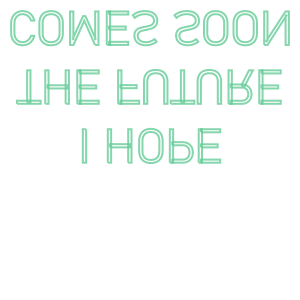

In [395]:
mls = geometries[1]
text_geos = MultiLineString([l for l in mls[4:]])
text_geos

In [396]:
page_x_inches: float = 11 # inches
page_y_inches: float = 8.5 # inches
border:float = 0.

buffer_style = 3

In [397]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)
xmin, ymin, xmax, ymax = drawbox.bounds

In [505]:
mp = so.unary_union(gp.consolidate_polygons([Polygon(ls) for ls in text_geos]))
smp = gp.scale_like(mp, drawbox)
smp = sa.scale(smp, xfact=0.9, yfact=0.9)
cmp = gp.center_at(smp, drawbox.centroid)
dp = gp.robust_difference(drawbox, cmp)

In [605]:
pts = gp.get_random_points_in_polygon(dp, n_points=80)
border_pts = ([drawbox.boundary.interpolate(i, normalized=True) for i in np.random.uniform(size=60)])
corners = [Point(x,y) for x in [xmin, xmax] for y in [ymin, ymax]]
text_pts = ([cmp.boundary.interpolate(i, normalized=True) for i in np.random.uniform(size=120)])
all_pts = MultiPoint(pts + text_pts + corners +border_pts)

In [664]:
tris = MultiPolygon(so.triangulate(all_pts))

In [670]:
bps = []
for p in tris:
    d = p.centroid.distance(drawbox.centroid)
    buffer_dist = np.interp(d, [0, 175], [-0.3, -3])
    bps.append(p.buffer(buffer_dist, join_style=2, cap_style=2))
bgps = MultiPolygon(bps)

In [671]:
bgpus = so.unary_union([p.buffer(np.random.choice([0., 1], p=[0.8,0.2]), join_style=2, cap_style=2) for p in bgps])

In [672]:
bps = []
for p in bgpus:
    d = p.centroid.distance(drawbox.centroid)
    buffer_dist = np.interp(d, [0, 175], [-0.1, -0.2])
    bps.append(p.buffer(buffer_dist, join_style=2, cap_style=2))
bgpus = MultiPolygon(bps)

100%|██████████| 333/333 [00:00<00:00, 1244.14it/s]


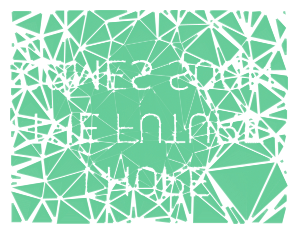

In [678]:
bg_fills = []
for p in tqdm(bgpus):
    d = p.centroid.distance(drawbox.centroid)
    d_buffer = np.interp(d, [0, 175], [-0.3, -0.55])
    angle = np.interp(d, [0, 175], [np.radians(-30), np.radians(-150)])
    stp = gp.ScaleTransPrms(n_iters=80, d_buffer=d_buffer, 
                            d_translate_factor=0.7,
                            angles=angle)
    db_mults = gp.gaussian_random_walk(n=stp.d_buffers.shape[0], step_std=1.5, step_mu=-0.4)
    db_mults[db_mults<0.] = 0.05
    stp.d_buffers *= db_mults
    scaled = gp.scale_trans(p, **stp.prms, join_style=2, cap_style=2, mitre_limit=30)
    fill = gp.merge_LineStrings([f.boundary for f in reversed(scaled)])
    bg_fills.append(fill)
    
bg = dp.intersection(gp.merge_LineStrings(bg_fills))
bg

In [610]:
text_hatch = gp.connected_hatchbox(cmp, angle=45, spacing=0.15, dist_thresh=0.25)

In [680]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
sk.stroke(1)
sk.geometry(bg)
sk.stroke(2)
sk.geometry(text_hatch)
sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2020-12-06T12:57:55.475721

In [681]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0097_future_come_soon.svg'

sk.save(savepath)

vpype_commands = 'reloop linesimplify --tolerance 0.2mm linemerge --tolerance 0.2mm linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

# try 3

In [682]:
svgpath = '/mnt/c/code/side/plotter_images/future_comes_soon3.svg'
doc = vpype.read_multilayer_svg(svgpath, quantization=1)

In [683]:
geometries = {}
for k,v in doc.layers.items():
    geometries[k] = v.as_mls()

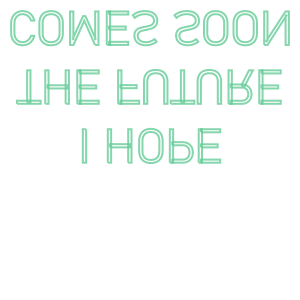

In [684]:
mls = geometries[1]
text_geos = MultiLineString([l for l in mls[4:]])
text_geos

In [685]:
page_x_inches: float = 11 # inches
page_y_inches: float = 8.5 # inches
border:float = 0.

buffer_style = 3

In [686]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)
xmin, ymin, xmax, ymax = drawbox.bounds

In [884]:
mp = so.unary_union(gp.consolidate_polygons([Polygon(ls) for ls in text_geos]))
smp = gp.scale_like(mp, drawbox)
smp = sa.scale(smp, xfact=0.9, yfact=0.9)
cmp = gp.center_at(smp, drawbox.centroid)
cmp = sa.translate(cmp, yoff=10)
dp = gp.robust_difference(drawbox, cmp)

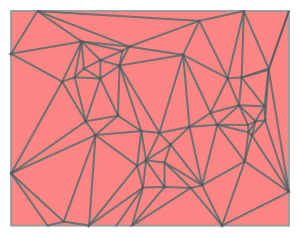

In [903]:
pts = gp.get_random_points_in_polygon(dp, n_points=10)
border_pts = ([drawbox.boundary.interpolate(i, normalized=True) for i in np.random.uniform(size=10)])
corners = [Point(x,y) for x in [xmin, xmax] for y in [ymin, ymax]]
text_pts = ([cmp.boundary.interpolate(i, normalized=True) for i in np.random.uniform(size=30)])
all_pts = MultiPoint(pts + text_pts + corners +border_pts)
tris = MultiPolygon(so.triangulate(all_pts))
tris

In [904]:
bps = []
for p in tris:
    d = p.centroid.distance(drawbox.centroid)
    buffer_dist = np.interp(d, [0, 175], [-0.3, -3])
    bps.append(p.buffer(buffer_dist, join_style=2, cap_style=2))

cpts = gp.get_random_points_in_polygon(dp, n_points=60)
bps += [c.buffer(np.random.uniform(7, 38)) for c in cpts]


bgps = MultiPolygon(bps)

btbs = so.unary_union([p.boundary.buffer(np.random.uniform(0.1, 2), join_style=2, cap_style=2) for p in bgps]).intersection(drawbox)

dpd = dp.difference(btbs)

In [916]:
bg_fills = []
for p in tqdm(dpd):
    d = p.centroid.distance(drawbox.centroid)
    d_buffer = np.interp(d, [0, 175], [-0.3, -0.5])
    stp = gp.ScaleTransPrms(n_iters=80, d_buffer=d_buffer, 
                            d_translate_factor=0.5,
                            angles=angle)
    db_mults = gp.gaussian_random_walk(n=stp.d_buffers.shape[0], step_std=1.5, step_mu=-0.4)
    db_mults[db_mults<0.] = 0.05
    stp.d_buffers *= db_mults
    stp.angles = np.linspace(0, np.radians(360*0.5), len(stp.d_buffers))
    scaled = gp.scale_trans(p, **stp.prms, join_style=2, cap_style=2, mitre_limit=30)
    
    fill = gp.merge_LineStrings([f.boundary for f in reversed(scaled)])
    bg_fills.append(fill)
    
layer = dp.intersection(gp.merge_LineStrings(bg_fills))
layer

100%|██████████| 777/777 [00:00<00:00, 1683.61it/s]


In [904]:
stp = gp.ScaleTransPrms(n_iters=200, d_buffer=-0.35, d_translate_factor=0.5, angles=np.radians(-45))
stp.d_buffers *= gp.gaussian_random_walk(n=stp.d_buffers.shape[0], step_std=15)

stp.angles = np.linspace(0, np.radians(360*0.5), len(stp.d_buffers))

scaled = gp.scale_trans(dpd, **stp.prms)

layer = gp.merge_LineStrings([p.boundary for p in reversed(scaled)])

In [919]:
text_hatch = gp.connected_hatchbox(cmp, angle=90, spacing=0.25, dist_thresh=0.35)

In [920]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
sk.stroke(1)
sk.geometry(layer)
sk.stroke(2)
sk.geometry(text_hatch)
sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2020-12-06T15:47:19.737733 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 

In [921]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0099_future_come_soon.svg'

sk.save(savepath)

vpype_commands = 'reloop linesimplify --tolerance 0.05mm linemerge --tolerance 0.2mm linesort'
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write --page-format {page_format} {savepath}'

os.system(vpype_str)

512

# try 4

In [215]:
page_x_inches: float = 11 # inches
page_y_inches: float = 14 # inches
border:float = 30.

buffer_style = 3

In [216]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)
xmin, ymin, xmax, ymax = drawbox.bounds

In [217]:
svgpath = '/mnt/c/code/side/plotter_images/time2.svg'
doc = vpype.read_multilayer_svg(svgpath, quantization=1)

In [218]:
geometries = {}
for k,v in doc.layers.items():
    geometries[k] = v.as_mls()

In [219]:
mls = geometries[1]
text_geos = MultiLineString([l for l in mls[:34]])
stars = MultiLineString([l for l in mls[34:]])

In [220]:
text_polys = list(text_geos.buffer(4, cap_style=1, join_style=1))

In [221]:
pbar_start = text_polys[5].centroid.x-15
pbar_end = text_polys[6].centroid.x+15


In [222]:
pbar = box(minx=pbar_start, miny=610,
           maxx=pbar_end, maxy=670)

In [223]:

star_polys = [Polygon(ls) for ls in stars]
polys = text_polys + star_polys + [pbar]

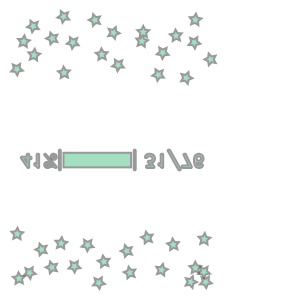

In [224]:
so.unary_union(gp.consolidate_polygons(polys))

In [137]:
mp = so.unary_union(gp.consolidate_polygons(polys))
smp = gp.scale_like(mp, drawbox)
smp = sa.scale(smp, xfact=0.9, yfact=0.9)
cmp = gp.center_at(smp, drawbox.centroid)
cmp = sa.translate(cmp, yoff=10)
dp = gp.robust_difference(drawbox, cmp)

In [237]:
stp = gp.ScaleTransPrms(n_iters=280, d_buffer=-0.4, 
                            d_translate_factor=0.4,
                            angles=0)
stp.angles = np.linspace(0, np.radians(360*2), len(stp.d_buffers))
db_mults = gp.gaussian_random_walk(n=stp.d_buffers.shape[0], step_std=9.5, step_mu=-0.)
db_mults[db_mults<0.] = 0.05
stp.d_buffers *= db_mults
scaled = gp.scale_trans(dp, **stp.prms, join_style=2, cap_style=2, mitre_limit=30)
    
fill = gp.merge_LineStrings([f.boundary for f in scaled])

In [272]:
dists = [-f.hausdorff_distance(dp.centroid) for f in fill]

In [273]:
sort_fill = gp.merge_LineStrings([fill[i] for i in np.argsort(dists)])

In [238]:
pbstart = pb.bounds[0]
pbend = pb.bounds[2]
pbwidth = pbend-pbstart

In [239]:

pbar_fill = box(minx=pbstart+1, miny=pb.bounds[1]+1,
           maxx=pbstart+pbwidth*0.41-1, maxy=pb.bounds[3]-1)

In [240]:
pbar_hatch = gp.hatchbox(pbar_fill, angle=90, spacing=0.25)

In [280]:
pbar_hatch_r = MultiLineString([ls for ls in reversed(pbar_hatch)])

In [281]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
sk.stroke(1)
sk.geometry(sort_fill)
sk.stroke(2)
sk.geometry(pbar_hatch_r)
sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2020-12-18T12:34:00.258215 
 
 
 
 
 
 
 
 
 
 
 <polygon points="300.7778,1336.0134 300.7448,1321.5596 276.4522,1304.9237 304.4334,1295.7614 312.7485,1267.5172 330.1089,1291.2973 359.5402,1290.4776 342.2886,1314.3367 350.0054,1336.0134 443.4225,1336.0134 439.0903,1309.655 412.45,1297.1183 438.6052,1283.5989 442.2958,1254.3882 463.2362,1275.0858 492.1575,1269.5694 478.944,1295.8806 493.1275,1321.6818 464.0209,1317.2456 446.3959,1336.0134 894.796,1336.0134 882.6485,1316.8081 853.2279,1315.667 872.0294,1293.0091 864.0229,1264.6757 891.382,1275.5554 915.8546,1259.1856 913.9618,1288.5675 937.0928,1306.7837 908.5641,1314.0631 900.4788,1336.0134 1045.2796,1336.0134 1045.2796,7.4437 4.7099,7.4437 4.7099,1336.0134"/>
 <polygon points="298.6938,1334.3872 298.666,1322.212 272.5273,1304.3117 302.6348,1294.4532 311.5819,1264.0626 330.2616,1289.6498 361.9295,1288.7679 343.3669,1314.4401 350.4679,1334.3872 441.0768,1334.3872 437.1565,1310.5354 408.4917,1297.046 436.6346,1282.4992 440.6057,1251.0685 463.1374,1273.3391 494.2566,1267.4035 480.039,1295.7142 495.3004,1323.4762 463.9818,1318.7028 449.2525,1334.3872 891.4989,1334.3872 881.2179,1318.1327 849.5615,1316.9049 869.7918,1292.5252 861.1768,1262.0385 890.6151,1273.745 916.9474,1256.1312 914.9108,1287.7459 939.7997,1307.3465 909.103,1315.1791 902.0277,1334.3872 1043.1989,1334.3872 1043.1989,8.7998 5.6116,8.7998 5.6116,1334.3872"/>
 <polygon points="296.7031,1332.8211 296.6802,1322.7922 268.8025,1303.7011 300.9131,1293.1866 310.4554,1260.7741 330.3779,1288.0637 364.1527,1287.1231 344.3551,1314.5033 350.8761,1332.8211 438.8396,1332.8211 435.3074,1311.3305 404.7355,1296.9436 434.7508,1281.429 438.9861,1247.9073 463.0169,1271.6595 496.2064,1265.329 481.0429,1295.5232 497.3196,1325.1322 463.9174,1320.0413 451.9158,1332.8211 888.3656,1332.8211 879.8427,1319.3463 846.0802,1318.0367 867.6564,1292.035 858.4683,1259.5201 889.8652,1272.0055 917.9494,1253.2197 915.7773,1286.9379 942.322,1307.8425 909.583,1316.1961 903.4593,1332.8211 1041.2115,1332.8211 1041.2115,10.0431 6.4335,10.0431 6.4335,1332.8211"/>
 <polygon points="294.7773,1331.2857 294.7591,1323.3164 265.2126,1303.0825 299.2453,1291.9386 309.3588,1257.586 330.4738,1286.5091 366.2703,1285.5121 345.2877,1314.5313 351.2521,1331.2857 436.6772,1331.2857 433.5174,1312.0608 401.1156,1296.8128 432.9275,1280.3695 437.4162,1244.8412 462.8855,1270.0152 498.0617,1263.3057 481.9905,1295.3074 499.2415,1326.6887 463.84,1321.293 454.4558,1331.2857 885.3433,1331.2857 878.5075,1320.4782 842.724,1319.0902 865.5917,1291.5321 855.8536,1257.0709 889.1298,1270.3036 918.8951,1250.3934 916.593,1286.1298 944.7267,1308.2858 910.028,1317.1394 904.8172,1331.2857 1039.2887,1331.2857 1039.2887,11.2034 7.2065,11.2034 7.2065,1331.2857"/>
 <polygon points="292.9319,1329.7959 292.9182,1323.7772 261.7913,1302.461 297.6444,1290.7211 308.2988,1254.531 330.5432,1285.0012 368.2544,1283.9509 346.1495,1314.5222 351.5868,1329.7959 434.6078,1329.7959 431.8007,1312.7169 397.6658,1296.6533 431.1793,1279.3304 435.9081,1241.9018 462.7396,1268.4223 498.1262,1261.6727 506.8338,1241.9884 487.0654,1209.8569 524.5935,1213.7104 549.0435,1184.9799 556.9755,1221.8625 591.8552,1236.2376 559.229,1255.1787 556.336,1292.7931 528.2397,1267.6173 492.2827,1276.3175 482.8665,1295.0673 501.0403,1328.1271 463.7452,1322.4429 456.8399,1329.7959 882.4595,1329.7959 877.2215,1321.5145 839.524,1320.0523 863.6149,1291.0202 853.3559,1254.7157 888.412,1268.6562 919.7694,1247.6811 917.3441,1285.329 946.9826,1308.67 910.428,1317.9972 906.0819,1329.7959 1037.4463,1329.7959 1037.4463,12.2668 7.9171,12.2668 7.9171,1329.7959"/>
 <polygon points="291.064,1328.2482 291.0548,1324.23 258.3071,1301.8039 296.0271,1289.4526 307.2364,1251.378 330.6391,1283.4348 370.314,1282.3298 347.058,1314.4931 351.9547,1328.2482 432.5101,1328.2482 430.0648,1313.3699 394.1523,1296.4698 429.4109,1278.245 434.386,1238.8673 462.6147,1266.7688 496.6509,1260.2768 504.8023,1241.8498 4

In [282]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0123_progress_bar.svg'

sk.save(savepath, paper_size=(px, py))

# vpype_commands = 'linesimplify --tolerance 0.1mm linemerge --tolerance 0.1mm'
# vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write {savepath}'

# os.system(vpype_str)

# try 5

In [470]:
page_x_inches: float = 10 # inches
page_y_inches: float = 7 # inches
border:float = 20.

buffer_style = 3

In [471]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)
xmin, ymin, xmax, ymax = drawbox.bounds

In [472]:
svgpath = '/mnt/c/code/side/plotter_images/time3.svg'
doc = vpype.read_multilayer_svg(svgpath, quantization=1)

In [473]:
geometries = {}
for k,v in doc.layers.items():
    geometries[k] = v.as_mls()

In [474]:
mls = geometries[1]
text_geos = MultiLineString([l for l in mls[:34]])
stars = MultiLineString([l for l in mls[34:]])

In [475]:
pbar_start = text_polys[5].centroid.x-15
pbar_end = text_polys[6].centroid.x+15


In [476]:
pbary = text_geos[5].centroid.y

In [477]:
text_polys = list(text_geos.buffer(5, cap_style=1, join_style=1))

In [478]:
pbar = box(minx=pbar_start, miny=pbary-20,
           maxx=pbar_end, maxy=pbary+40)

In [479]:

star_polys = [Polygon(ls) for ls in stars]
polys = text_polys + star_polys + [pbar]

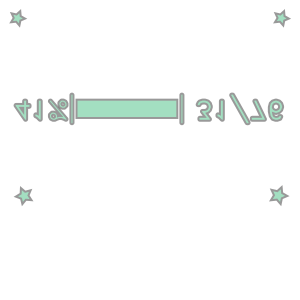

In [480]:
so.unary_union(gp.consolidate_polygons(polys))

In [481]:
mp = so.unary_union(gp.consolidate_polygons(polys))
smp = gp.scale_like(mp, drawbox)
smp = sa.scale(smp, xfact=0.9, yfact=0.9)
cmp = gp.center_at(smp, drawbox.centroid)
cmp = sa.translate(cmp, yoff=10)
dp = gp.robust_difference(drawbox, cmp)

In [482]:
stp = gp.ScaleTransPrms(n_iters=280, d_buffer=-0.45, 
                            d_translate_factor=0.4,
                            angles=0)
stp.angles = np.linspace(0, np.radians(360*0), len(stp.d_buffers))
db_mults = gp.gaussian_random_walk(n=stp.d_buffers.shape[0], step_std=9.5, step_mu=-0.)
db_mults[db_mults<0.] = 0.05
stp.d_buffers *= db_mults
scaled = gp.scale_trans(dp, **stp.prms, join_style=2, cap_style=2, mitre_limit=30)
    
fill = gp.merge_LineStrings([f.boundary for f in scaled])

In [483]:
dists = [-f.hausdorff_distance(dp.centroid) for f in fill]

In [484]:
sort_fill = gp.merge_LineStrings([fill[i] for i in np.argsort(dists)])

In [485]:
pb = polys[-1]

In [486]:
pbstart = pb.bounds[0]
pbend = pb.bounds[2]
pbwidth = pbend-pbstart

In [487]:

pbar_fill = box(minx=pbstart+1, miny=pb.bounds[1]+1,
           maxx=pbstart+pbwidth*0.41-1, maxy=pb.bounds[3]-1)

In [488]:
pbar_hatch = gp.hatchbox(pbar_fill, angle=90, spacing=0.25)

In [489]:
pbar_hatch_r = MultiLineString([ls for ls in reversed(pbar_hatch)])

In [ ]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
sk.stroke(1)
sk.geometry(sort_fill)
# sk.stroke(2)
# sk.geometry(pbar_hatch_r)
sk.display(color_mode='layer')

In [491]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0124_progress_bar.svg'

sk.save(savepath, paper_size=(px, py))

# vpype_commands = 'linesimplify --tolerance 0.1mm linemerge --tolerance 0.1mm'
# vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write {savepath}'

# os.system(vpype_str)

# try 6

In [143]:
svgpath = '/mnt/c/code/side/plotter_images/relief_comes_soon.svg'
doc = vpype.read_multilayer_svg(svgpath, quantization=1)

In [144]:
geometries = {}
for k,v in doc.layers.items():
    geometries[k] = v.as_mls()

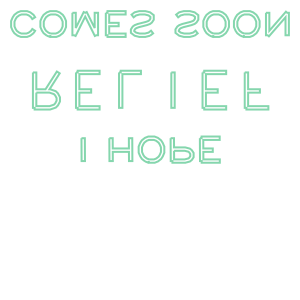

In [145]:
mls = geometries[1]
text_geos = MultiLineString([l for l in mls[4:]]).buffer(5, cap_style=2, join_style=2).boundary
text_geos

In [146]:
page_x_inches: float = 11 # inches
page_y_inches: float = 8.5 # inches
border:float = 0.

buffer_style = 3

In [147]:
px = utils.DistanceConverter(page_x_inches, 'inches').mm
py = utils.DistanceConverter(page_y_inches, 'inches').mm
page_format = f'{px}mmx{py}mm'
drawbox = sg.box(border, border, px-border, py-border)
xmin, ymin, xmax, ymax = drawbox.bounds

In [148]:
mp = so.unary_union(gp.consolidate_polygons([Polygon(ls) for ls in text_geos]))
smp = gp.scale_like(mp, drawbox)
smp = sa.scale(smp, xfact=0.9, yfact=0.9)
cmp = gp.center_at(smp, drawbox.centroid)
cmp = sa.translate(cmp, yoff=10)
dp = gp.robust_difference(drawbox, cmp)

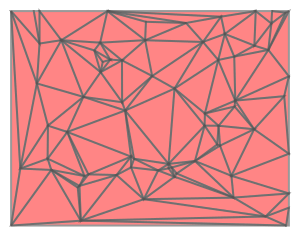

In [149]:
pts = gp.get_random_points_in_polygon(dp, n_points=30)
border_pts = ([drawbox.boundary.interpolate(i, normalized=True) for i in np.random.uniform(size=10)])
corners = [Point(x,y) for x in [xmin, xmax] for y in [ymin, ymax]]
text_pts = ([cmp.boundary.interpolate(i, normalized=True) for i in np.random.uniform(size=30)])
all_pts = MultiPoint(pts + text_pts + corners +border_pts)
tris = MultiPolygon(so.triangulate(all_pts))
tris

In [150]:
bps = []
for p in tris:
    d = p.centroid.distance(drawbox.centroid)
    buffer_dist = np.interp(d, [0, 175], [-0.3, -3])
    bps.append(p.buffer(buffer_dist, join_style=2, cap_style=2))

cpts = gp.get_random_points_in_polygon(dp, n_points=60)
bps += [c.buffer(np.random.uniform(7, 38)) for c in cpts]


bgps = MultiPolygon(bps)

btbs = so.unary_union([p.boundary.buffer(np.random.uniform(0.1, 2), join_style=2, cap_style=2) for p in bgps]).intersection(drawbox)

dpd = dp.difference(btbs)

In [151]:
angle = 45

100%|██████████| 814/814 [00:00<00:00, 1766.58it/s]


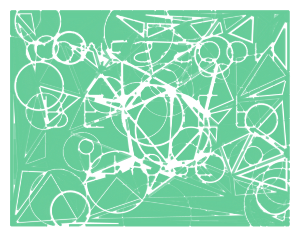

In [152]:
bg_fills = []
for p in tqdm(dpd):
    d = p.centroid.distance(drawbox.centroid)
    d_buffer = np.interp(d, [0, 175], [-0.3, -0.5])
    stp = gp.ScaleTransPrms(n_iters=80, d_buffer=d_buffer, 
                            d_translate_factor=0.5,
                            angles=angle)
    db_mults = gp.gaussian_random_walk(n=stp.d_buffers.shape[0], step_std=1.5, step_mu=-0.4)
    db_mults[db_mults<0.] = 0.05
    stp.d_buffers *= db_mults
    stp.angles = np.linspace(0, np.radians(360*0.5), len(stp.d_buffers))
    scaled = gp.scale_trans(p, **stp.prms, join_style=2, cap_style=2, mitre_limit=30)
    
    fill = gp.merge_LineStrings([f.boundary for f in reversed(scaled)])
    bg_fills.append(fill)
    
layer = dp.intersection(gp.merge_LineStrings(bg_fills))
layer

In [153]:
stp = gp.ScaleTransPrms(n_iters=200, d_buffer=-0.35, d_translate_factor=0.5, angles=np.radians(-45))
stp.d_buffers *= gp.gaussian_random_walk(n=stp.d_buffers.shape[0], step_std=15)

stp.angles = np.linspace(0, np.radians(360*0.5), len(stp.d_buffers))

scaled = gp.scale_trans(dpd, **stp.prms)

layer = gp.merge_LineStrings([p.boundary for p in reversed(scaled)])

In [166]:
text_hatch = gp.connected_hatchbox(cmp, angle=-90, spacing=0.3, dist_thresh=0.35)

In [170]:
text_hatch = gp.merge_LineStrings(reversed([ls for ls in text_hatch]))

In [172]:
sk = vsketch.Vsketch()
sk.size(page_format)
sk.scale('1mm')
sk.penWidth('0.25mm')
sk.stroke(1)
sk.geometry(layer)
sk.stroke(2)
sk.geometry(text_hatch)
sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-01-02T22:37:05.545430 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polygon points="272.7423,299.4935 277.8988,297.4971 277.8707,297.4377 277.7304,297.2037 277.5679,296.9845 277.3846,296.7823 277.1824,296.5991 276.9633,296.4366 276.7292,296.2963 276.4826,296.1796 276.2257,296.0877 275.961,296.0214 275.6911,295.9814 275.4185,295.968 275.146,295.9814 274.8761,296.0214 274.6114,296.0877 274.3545,296.1796 274.1079,296.2963 273.8738,296.4366 273.6546,296.5991 273.4525,296.7823 273.2692,296.9845 273.1067,297.2037 272.9664,297.4377 272.8497,297.6844 272.7578,297.9413 272.6915,298.206 272.6515,298.4759 272.6381,298.7484 272.6515,299.021 272.6915,299.2909"/>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polygon points="272.7129,301.4273 280.2404,298.513 280.2394,298.4921 280.179,298.0846 280.0788,297.6849 279.9401,297.297 279.7639,296.9246 279.5521,296.5712 279.3067,296.2403 279.03,295.9351 278.7248,295.6584 278.3939,295.413 278.0405,295.2012 277.6681,295.025 277.2802,294.8862 276.8805,294.7861 276.473,294.7257 276.0615,294.7055 275.65,294.7257 275.2425,294.7861 274.8429,294.8862 274.455,295.025 274.0825,295.2012 273.7292,295.413 273.3983,295.6584 273.093,295.9351 272.8163,296.2403 272.5709,296.5712 272.3591,296.9246 272.183,297.297 272.0442,297.6849 271.9441,298.0846 271.8836,298.4921 271.8634,298.9036 271.8836,299.3151 271.9441,299.7226 272.0442,300.1222 272.183,300.5101 272.3591,300.8826 272.5709,301.2359"/>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polygon points="272.9955,303.1394 282.2113,299.5715 282.237,299.0486 282.2103,298.5065 282.1307,297.9697 281.9988,297.4433 281.816,296.9323 281.584,296.4417 281.305,295.9762 280.9817,295.5403 280.6172,295.1382 280.2151,294.7737 279.7792,294.4504 279.3137,294.1714 278.8231,293.9394 278.3121,293.7566 277.7857,293.6247 277.2489,293.5451 276.7068,293.5184 276.1648,293.5451 275.628,293.6247 275.1015,293.7566 274.5905,293.9394 274.0999,294.1714 273.6345,294.4504 273.1986,294.7737 272.7964,295.1382 272.432,295.5403 272.1087,295.9762 271.8297,296.4417 271.5977,296.9323 271.4148,297.4433 271.283,297.9697 271.2033,298.5065 271.1767,299.0486 271.2033,299.5906 271.283,300.1275 271.4148,300.6539 271.5977,301.1649 271.8297,301.6555 272.1087,302.121 272.432,302.5569 272.7964,302.959"/>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polygon points="273.4004,304.8608 284.0989,300.7189 284.1452,300.5342 284.2449,299.862 284.2782,299.1834 284.2449,298.5047 284.1452,297.8326 283.9801,297.1735 283.7512,296.5337 283.4607,295.9195 283.1114,295.3367 282.7066,294.7909 282.2503,294.2875 281.7468,293.8312 281.2011,293.4264 280.6183,293.0771 280.004,292.7866 279.3643,292.5576 278.7052,292.3925 278.033,292.2928 277.3544,292.2595 276.6757,292.2928 276.0036,292.3925 275.3445,292.5576 274.7047,292.7866 274.0905,293.0771 273.5077,293.4264 272.9619,293.8312 272.4585,294.2875 272.0021,294.7909 271.5974,295.3367 271.2481,295.9195 270.9575,296.5337 270.7286,297.1735 270.5635,297.8326 270.4638,298.5047 270.4305,299.1834 270.4638,299.862 270.5635,300.5342 270.7286,301.1933 270.9575,301.833 271.2481,302.4473 271.5974,303.0301 272.0021,303.5758 272.4585,304.0793 272.9619,304.5356"/>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polygon points="273.9132,306.4103 285.8152,301.8025 285.8555,301.6897 286.0512,300.9086 286.1693,300.1121 286.2088,299.3079 286.1693,298.5037 286.0512,297.7072 285.8555,296.9262 285.5843,296.1681 285.24,295.4402 284.8261,294.

In [173]:
savepath = '/mnt/c/code/side/plotter_images/oned_outputs/0153_relief_come_soon.svg'

sk.save(savepath)

vpype_commands = 'reloop linemerge --tolerance 0.2mm '
vpype_str = f'vpype read -q 0.05mm {savepath} {vpype_commands} write {savepath}'

os.system(vpype_str)

0